# Importing the libraries

In [1]:
import scipy
import numpy as np
import h5py
import glob
import pickle
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from tqdm import tqdm
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Dropout, SpatialDropout2D, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
import tensorflow.keras.backend as K
from tensorflow import keras

In [2]:
# GPU check for tensorflow/keras
print(tf.config.list_physical_devices('GPU'))
print( tf.test.is_built_with_cuda())

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
True


In [3]:
# Allow GPU growth for CUDA
# See if the GPU produces weird glitches first
config = tf.compat.v1.ConfigProto(gpu_options = 
                         tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.99)
# device_count = {'GPU': 1}
)
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

# Loading the satellite data
There are 180 satellite images and masks in TIF format. I will use these to train the networks. These 180 images will be split into train, validation and testing set. OR just train and test set, and test set can also be used as validation set.

For pre-processing steps, the images are resized from 5000 x 5000 pixels to 512 x 512 pixels for initial trial. Later I will try different resolutions to see if that makes any changes.

As limited number of images are available for this task, I will use data augmentation pipeline to generate more data for training. Networks will be trained both with normal data and augmented data to evaluate the performance.

In [38]:
# Function to read the image files
def load_files(path, target_size, scale_factor, img_type = 'image'):
    '''
    Function:
    Reads images of 'tif' from from a given path file.
    
    Parameters:
    path: type- string. tif image path.
    target_size: type - int. resizing dimension.
    scale_factor: type - float. scaling value.
    img_type: type - string. 'mask' to indicate loading mask files.
    '''
    image_list = []
    filenames = glob.glob(path)
    filenames.sort()
    for filename in tqdm(filenames):
        if img_type == 'mask':
            im = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
            im = cv2.resize(im, dsize=(target_size, target_size), interpolation=cv2.INTER_CUBIC)
            _, im = cv2.threshold(im, 0, 255, cv2.THRESH_BINARY_INV)
        else:
            im = cv2.imread(filename)
            im = cv2.resize(im, dsize=(target_size, target_size), interpolation=cv2.INTER_CUBIC)
        im=np.asarray(im) / scale_factor
        image_list.append(im)
    return np.asarray(image_list)

In [4]:
resize = 512 # Resizing dimension
scale = 255.0 # Scaling value for RGB images (range 0 - 255)

image_list = load_files(r'aerialimagelabeling/AerialImageDataset/train/images/*.tif', resize, scale)
mask_list = load_files(r'aerialimagelabeling/AerialImageDataset/train/gt/*.tif', resize, scale, 'mask')
mask_list = np.reshape(mask_list, (np.shape(mask_list) + (1, )))

print(np.shape(image_list))
print(np.shape(mask_list))

100%|████████████████████████████████████████████████████████████████████████████████| 180/180 [00:21<00:00,  8.47it/s]


(180, 512, 512, 3)
(180, 512, 512, 1)


In [5]:
# Fuction to save the resized images in compressed format.
# Can be used to load the saved images quickly during network trial.
def save_images(h5_name, train, mask):
    with h5py.File(h5_name, 'w') as hf:
        Xset = hf.create_dataset(name='imgs', data=train, compression="gzip", compression_opts=9)
        yset = hf.create_dataset(name='masks', data=mask, compression="gzip", compression_opts=9)
        
    hf.close()
    
save_images('train.h5', image_list, mask_list)

In [4]:
###################################################
# Run this only if you have the h5 files
# and don't want to process all the images again.
# Otherwise run the two cells above.
###################################################

with h5py.File('train.h5', 'r') as hf:
    image_list = np.array(hf['imgs'])
    mask_list = np.array(hf['masks'])


# with h5py.File('test.h5', 'r') as hf:
#     test_imgs = np.array(hf['imgs'])
#     test_masks = np.array(hf['masks'])

In [5]:
print(np.shape(image_list))
print(np.shape(mask_list))

(180, 512, 512, 3)
(180, 512, 512, 1)


In [6]:
def display_images(im_list, msk_list, img_to_disp = 8):
    fig = plt.figure(figsize = (20,15))
    for i, (im, msk) in enumerate(zip(im_list[:img_to_disp], msk_list[:img_to_disp])):
        ax = fig.add_subplot(4, 8, i*2+1)
        ax.imshow(im)
        ax = fig.add_subplot(4, 8, i*2+2)
        ax.imshow(msk)
        
        plt.tight_layout()

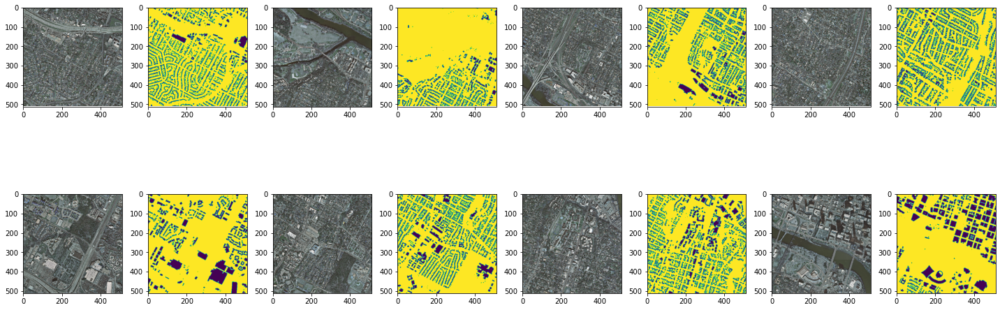

In [6]:
display_images(image_list, mask_list)

# Splitting the images in train and test set

In [7]:
seed = 42

X_train, X_test, y_train, y_test = train_test_split(image_list, mask_list, test_size=0.3, random_state=seed)

In [8]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(126, 512, 512, 3)
(126, 512, 512, 1)
(54, 512, 512, 3)
(54, 512, 512, 1)


# Helper functions

In [9]:
# def mask_to_categorical(im, num_classes):
#     one_hot_map = []
#     for i in range(num_classes):
#         class_map = tf.reduce_all(tf.equal(im, i+1), axis=-1)
#         one_hot_map.append(class_map)
#     one_hot_map = tf.stack(one_hot_map, axis=-1)
#     one_hot_map = tf.cast(one_hot_map, tf.float32)    
#     return one_hot_map

# def categorical_to_mask(im):
#     mask = tf.dtypes.cast(tf.argmax(im, axis=2), 'float32') / 255.0
#     return mask

def random_crop(img_x, img_y, random_crop_size):

    height, width = img_x.shape[0], img_x.shape[1]
    dy, dx = random_crop_size
    x = np.random.randint(0, width - dx + 1)
    y = np.random.randint(0, height - dy + 1)
    return img_x[y:(y+dy), x:(x+dx), :], img_y[y:(y+dy), x:(x+dx), :]

def crop_generator(batches, crop_length):
    """Take as input a Keras ImageGen (Iterator) and generate random
    crops from the image batches generated by the original iterator.
    """
    while True:
        batch_x, batch_y = next(batches)
        batch_crops_x = np.zeros((batch_x.shape[0], crop_length, crop_length, 3))
        batch_crops_y = np.zeros((batch_x.shape[0], crop_length, crop_length, 1))
        for i in range(batch_x.shape[0]):
            batch_crops_x[i], batch_crops_y[i] = random_crop(batch_x[i], batch_y[i], (crop_length, crop_length))
        yield (batch_crops_x, np.where(batch_crops_y > 0.5, 1, 0))

# Data Augmentation

In [10]:
train_datagen = ImageDataGenerator(zoom_range=0.1, horizontal_flip=True)
train_image_generator = train_datagen.flow(X_train, batch_size = 32, seed=4)
train_mask_generator = train_datagen.flow(y_train, batch_size = 32, seed=4)

In [11]:
train_generator = crop_generator(zip(train_image_generator, train_mask_generator), 128)

In [12]:
val_datagen = ImageDataGenerator(zoom_range=0.1)
test_image_generator = val_datagen.flow(X_test, batch_size = 32, seed=4)
test_mask_generator = val_datagen.flow(y_test, batch_size = 32, seed=4)
test_generator = crop_generator(zip(test_image_generator, test_mask_generator), 128)

# Image Visualization

With random crops, shifts and flips.

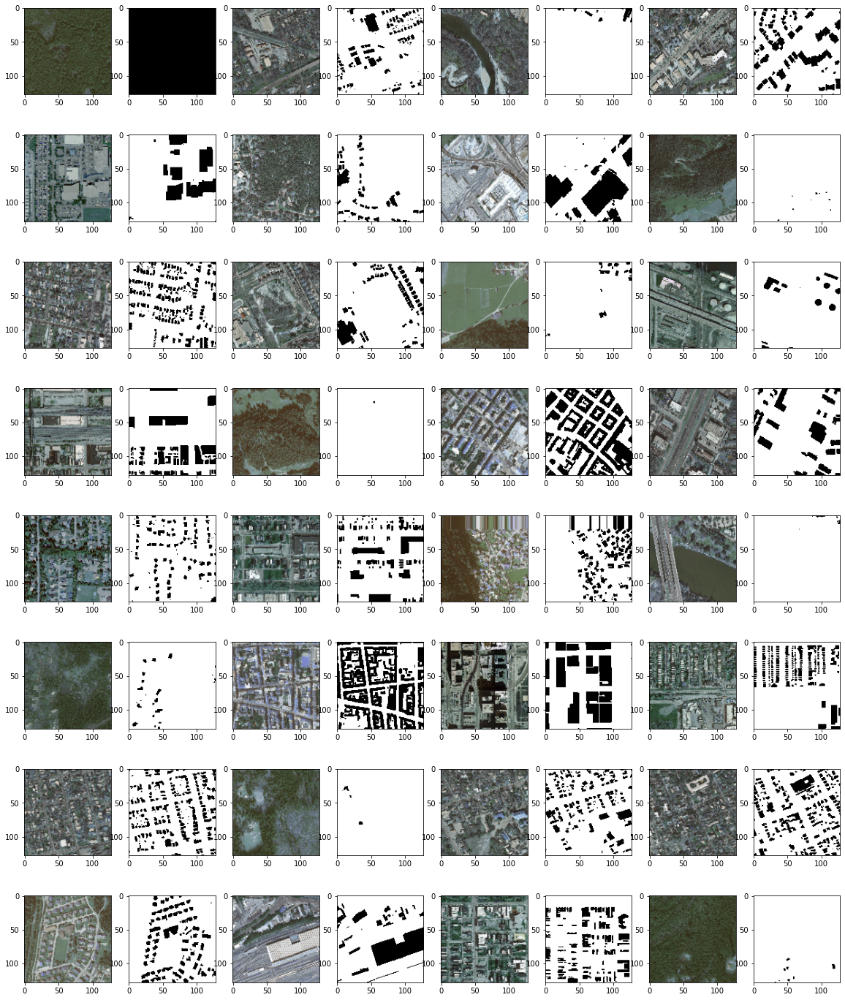

In [51]:
sample = next(train_generator)
fig = plt.figure(figsize=[20, 25])
for i,(img, msk) in enumerate(zip(sample[0], sample[1])):
    ax = fig.add_subplot(8, 8, i*2 + 1)
    ax.imshow(img)
    ax = fig.add_subplot(8, 8, i*2 + 2)
    ax.imshow(msk, cmap = 'gray')

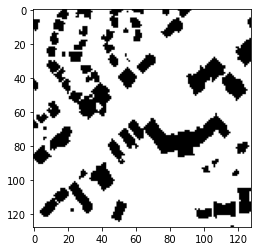

In [53]:
plt.imshow(sample[1][3], cmap = 'gray')

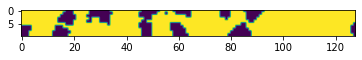

In [54]:
plt.imshow(np.reshape(sample[1][3][0:10], (10,128)))

In [55]:
np.unique(sample[1][3])

array([0, 1])

# Function for visualizing model training results

In [13]:
def visualise(model, test_data, test_gt):
    pred = model.predict(test_data)
    pred_ = np.where(pred > 0.5, 1, 0)
    fig = plt.figure(figsize=[20, 25])
    for i,img in enumerate(test_data):
        ax = fig.add_subplot(8, 12, i*3 + 1)
        ax.imshow(img)
        ax.set_title("Image")
        ax = fig.add_subplot(8, 12, i*3 + 2)
        ax.set_title("Original Mask")
        ax.imshow(test_gt[i])
        ax = fig.add_subplot(8, 12, i*3 + 3)
        ax.imshow(pred_[i])
        ax.set_title("Predicted")
        plt.tight_layout()

In [14]:
def show_prediction(model, test_data, test_gt):
    pred = model.predict(test_data)
    pred_ = np.where(pred > 0.5, 1, 0)
    fig = plt.figure(figsize=[20, 25])
    for i, (img, msk) in enumerate(zip(test_data[0:6], test_gt[0:6])):
        ax = fig.add_subplot(3, 6, i*3 + 1)
        ax.imshow(img)
        ax.set_title("Image")
        ax = fig.add_subplot(3, 6, i*3 + 2)
        ax.set_title("Original Mask")
        ax.imshow(msk)
        ax = fig.add_subplot(3, 6, i*3 + 3)
        ax.imshow(pred_[i])
        ax.set_title("Predicted")
        plt.tight_layout()

# Testing with simple network
Encoder-decoder style network

In [14]:
# input, colour images
input_img = Input(shape=(128, 128, 3))

# encoder, add more filters as we go deeper
x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

# decoder, reduce filters as we go back up
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

# output, 12 channels for 12 classes
decoded = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(x)

trial_1 = Model(input_img, decoded)
# loss is categorical_crossentropy, this will be calculated per-pixel and averaged
trial_1.compile(optimizer='adam', loss='binary_crossentropy')
print(trial_1.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 128, 128, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 64)        0     

In [15]:
trial_1.fit(train_generator, steps_per_epoch = 10, epochs=10,
              validation_data=test_generator, validation_steps = 10)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 10 steps, validate for 10 steps
Epoch 1/10
10/10 [==============================] - 97s 10s/step - loss: 0.6206 - val_loss: 0.5375
Epoch 2/10
10/10 [==============================] - 76s 8s/step - loss: 0.5254 - val_loss: 0.4880
Epoch 3/10
10/10 [==============================] - 64s 6s/step - loss: 0.5048 - val_loss: 0.4872
Epoch 4/10
10/10 [==============================] - 66s 7s/step - loss: 0.4792 - val_loss: 0.4716
Epoch 5/10
10/10 [==============================] - 53s 5s/step - loss: 0.4878 - val_loss: 0.4544
Epoch 6/10
10/10 [==============================] - 57s 6s/step - loss: 0.4771 - val_loss: 0.4543
Epoch 7/10
10/10 [==============================] - 63s 6s/step - loss: 0.4717 - val_loss: 0.4438
Epoch 8/10
10/10 [==============================] - 74s 7s/step - loss: 0.4371 - val_loss: 0.4028
Epoch 9/10
10/10 [==============================] - 76s 8s/step - loss: 0.3999 - val_loss: 0.3918
Epoch 10/10
10/10 [======

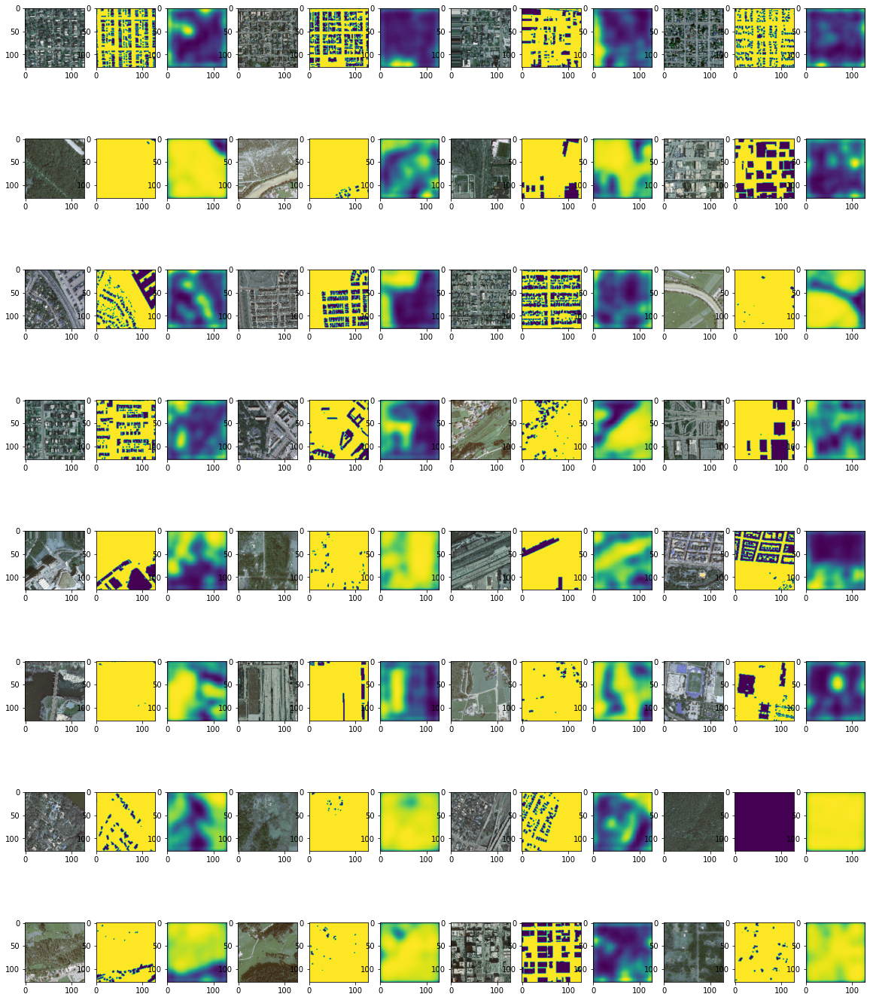

In [31]:
test_data, test_gt = next(test_generator)
visualise(trial_1, test_data, test_gt)

# Building the model

## The network

### Network framework

**Network v 1.0**

In [22]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
CHANNELS = 3

input_img = Input(shape = (IMG_WIDTH, IMG_HEIGHT, CHANNELS))

# Contraction Part
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(input_img) # Output 128 x 128
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1) # Output 128 x 128
conv1 = Dropout(0.1)(conv1)
pool1 = MaxPooling2D((2,2))(conv1) # Downsample 64 x 64

conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1) # Output 64 x 64
conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2) # Output 64 x 64
conv2 = Dropout(0.1)(conv2)
pool2 = MaxPooling2D((2, 2))(conv2) # Downsample 32 x 32

conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2) # Output 32 x 32
conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3) # Output 32 x 32
conv3 = Dropout(0.1)(conv3)
pool3 = MaxPooling2D((2, 2))(conv3) # Downsample 16 x 16

conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3) # Output 16 x 16
conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4) # Output 16 x 16
conv4 = Dropout(0.1)(conv4)
pool4 = MaxPooling2D((2, 2))(conv4) # Downsample 8 x 8

conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4) # Output 8 x 8
conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5) # Output 8 x 8

# Expansion Part
up1 = UpSampling2D((2, 2))(conv5) # Upsample 16 x 16

merge1 = concatenate([conv4, up1], axis = 3)
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge1) # Output 16 x 16
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6) # Output 16 x 16
conv6 = Dropout(0.1)(conv6)
up2 = UpSampling2D((2, 2))(conv6) # Upsample 32 x 32

merge2 = concatenate([conv3, up2], axis = 3)
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge2) # Output 32 x 32
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7) # Output 32 x 32
conv7 = Dropout(0.1)(conv7)
up3 = UpSampling2D((2, 2))(conv7) # Upsample 64 x 64

merge3 = concatenate([conv2, up3], axis = 3)
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge3) # Output 64 x 64
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8) # Output 64 x 64
conv8 = Dropout(0.1)(conv8)
up3 = UpSampling2D((2, 2))(conv8) # Upsample 128 x 128

merge3 = concatenate([conv1, up3], axis = 3)
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge3) # Output 128 x 128
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8) # Output 128 x 128
conv8 = Dropout(0.1)(conv8)

decoded = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(conv8)

segmenter_1 = Model(input_img, decoded, name= 'Segmenter1_CrossEntropy')
segmenter_1.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
print(segmenter_1.summary())

Model: "Segmenter1_CrossEntropy"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_14 (Conv2D)              (None, 128, 128, 16) 448         input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 128, 128, 16) 2320        conv2d_14[0][0]                  
__________________________________________________________________________________________________
dropout (Dropout)               (None, 128, 128, 16) 0           conv2d_15[0][0]                  
____________________________________________________________________________

In [23]:
callbacks = [ModelCheckpoint('segmenter_1_CrossEntropy_early_stop_best.h5', verbose = 1, save_best_only = True),
             EarlyStopping(patience = 3, monitor = 'val_loss'),
             TensorBoard(log_dir = 'logs')]


results_1 = segmenter_1.fit(train_generator, steps_per_epoch = 100, epochs=25,
              validation_data=test_generator, validation_steps = 10, callbacks = callbacks)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 100 steps, validate for 10 steps
Epoch 1/25
 99/100 [============================>.] - ETA: 4s - loss: 0.4239 - accuracy: 0.7730
Epoch 00001: val_loss improved from inf to 0.37282, saving model to segmenter_1_CrossEntropy.h5
100/100 [==============================] - 527s 5s/step - loss: 0.4229 - accuracy: 0.7733 - val_loss: 0.3728 - val_accuracy: 0.7888
Epoch 2/25
 99/100 [============================>.] - ETA: 4s - loss: 0.3530 - accuracy: 0.7877
Epoch 00002: val_loss did not improve from 0.37282
100/100 [==============================] - 516s 5s/step - loss: 0.3526 - accuracy: 0.7881 - val_loss: 0.3733 - val_accuracy: 0.7848
Epoch 3/25
 99/100 [============================>.] - ETA: 4s - loss: 0.3502 - accuracy: 0.7891
Epoch 00003: val_loss did not improve from 0.37282
100/100 [==============================] - 507s 5s/step - loss: 0.3501 - accuracy: 0.7890 - val_loss: 0.3944 - val_accuracy: 0.7834
Epoch 4/25
 99/100 [=====

In [60]:
segmenter_1 = keras.models.load_model('segmenter_1_CrossEntropy_early_stop_best.h5')

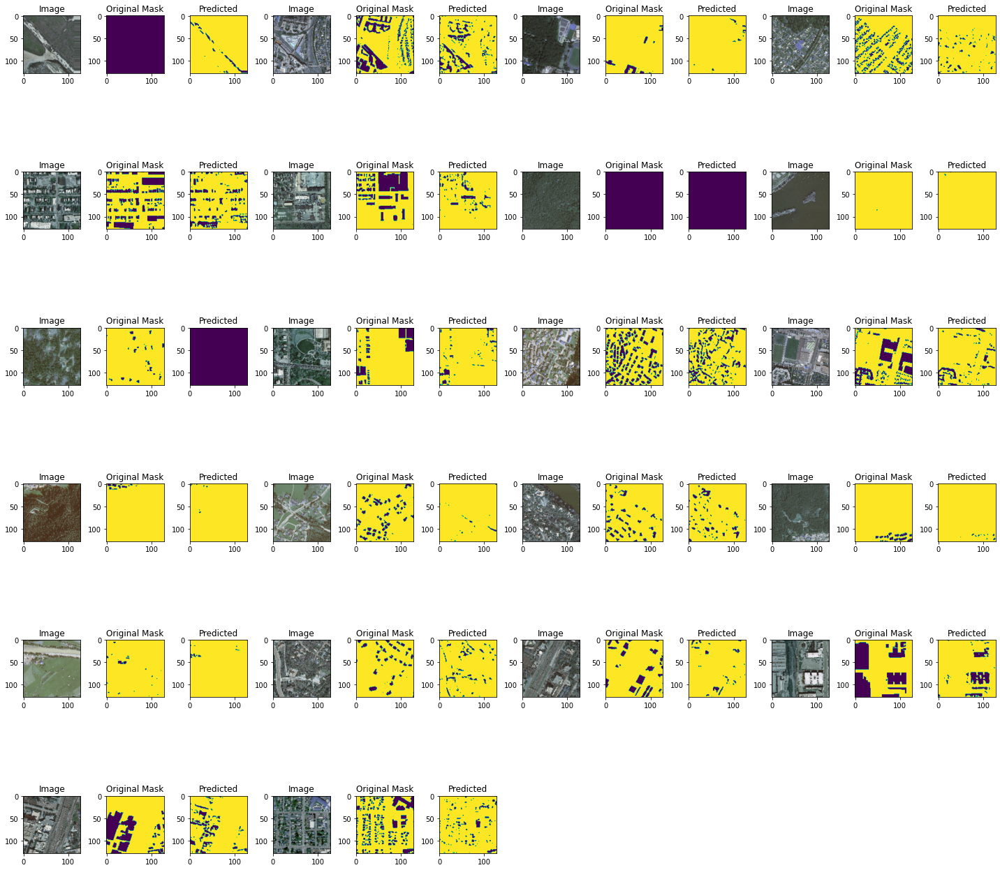

In [63]:
test_data, test_gt = next(test_generator)

visualise(segmenter_1, test_data, test_gt)

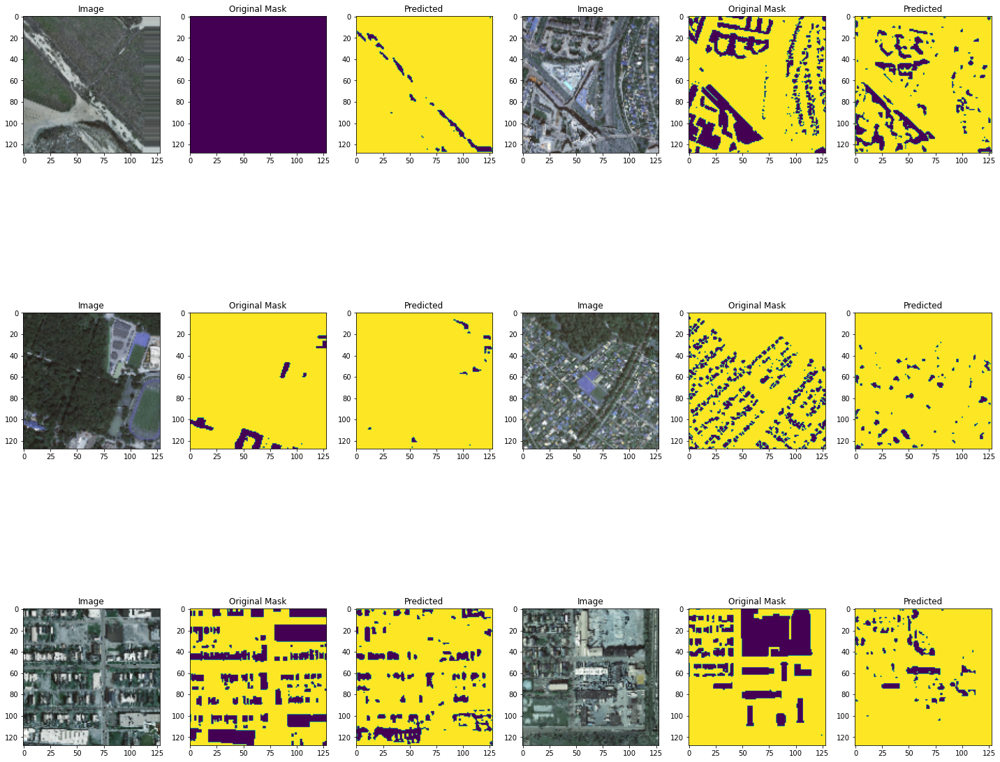

In [65]:
show_prediction(segmenter_1, test_data, test_gt)

In [40]:
callbacks = [ModelCheckpoint('segmenter_2_CrossEntropy.h5', verbose = 1, save_best_only = True)]
results_2 = segmenter_1.fit(train_generator, steps_per_epoch = 100, epochs=25,
              validation_data=test_generator, validation_steps = 10, callbacks = callbacks)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 100 steps, validate for 10 steps
Epoch 1/25
 99/100 [============================>.] - ETA: 1s - loss: 0.3132 - accuracy: 0.8063
Epoch 00001: val_loss improved from inf to 0.38396, saving model to segmenter_2_CrossEntropy.h5
100/100 [==============================] - 174s 2s/step - loss: 0.3128 - accuracy: 0.8065 - val_loss: 0.3840 - val_accuracy: 0.7826
Epoch 2/25
 99/100 [============================>.] - ETA: 1s - loss: 0.3240 - accuracy: 0.8036
Epoch 00002: val_loss did not improve from 0.38396
100/100 [==============================] - 166s 2s/step - loss: 0.3233 - accuracy: 0.8039 - val_loss: 0.4178 - val_accuracy: 0.7479
Epoch 3/25
 99/100 [============================>.] - ETA: 1s - loss: 0.3241 - accuracy: 0.8021
Epoch 00003: val_loss did not improve from 0.38396
100/100 [==============================] - 160s 2s/step - loss: 0.3238 - accuracy: 0.8021 - val_loss: 0.3939 - val_accuracy: 0.7781
Epoch 4/25
 99/100 [=====

In [41]:
segmenter_1.save('segmenter_1_CrossEntropy_full_run_full_model.h5')

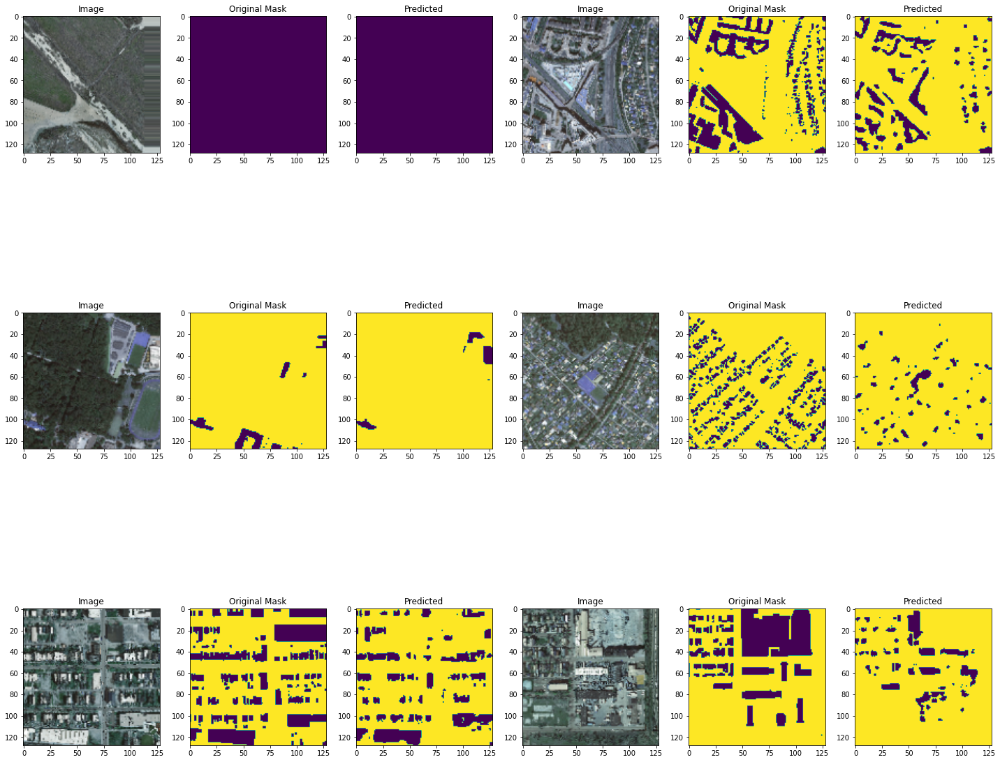

In [66]:
segmenter_1 = keras.models.load_model('segmenter_1_CrossEntropy_full_run_full_model.h5')

show_prediction(segmenter_1, test_data, test_gt)

In [26]:
def save_pickle(pkl_name, obj):
    with open(pkl_name, 'wb') as file_pi:
        pickle.dump(obj, file_pi)
        
        
def load_pickle(pkl_name):
    with open(pkl_name, "rb") as input_file:
        e = cPickle.load(input_file)
        
    return e

In [55]:
save_pickle("results_1.pkl", results_1.history)

In [19]:
def plot_model(history):
    keys = history.history.keys()
    for k in keys:
        plt.plot(history.history[k])
        plt.title(k)
        plt.show()

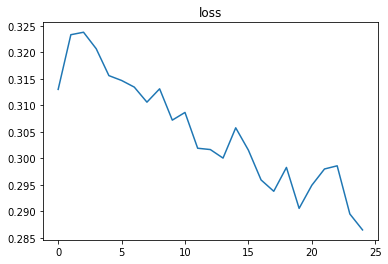

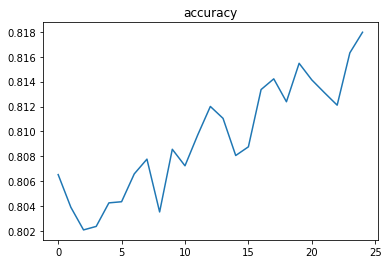

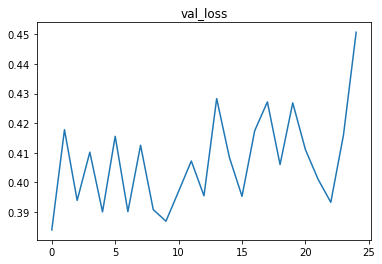

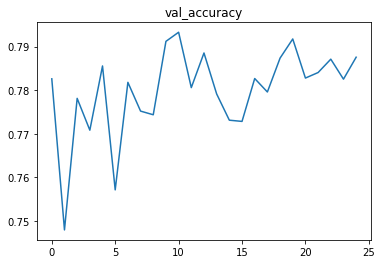

In [46]:
plot_model(results_2)

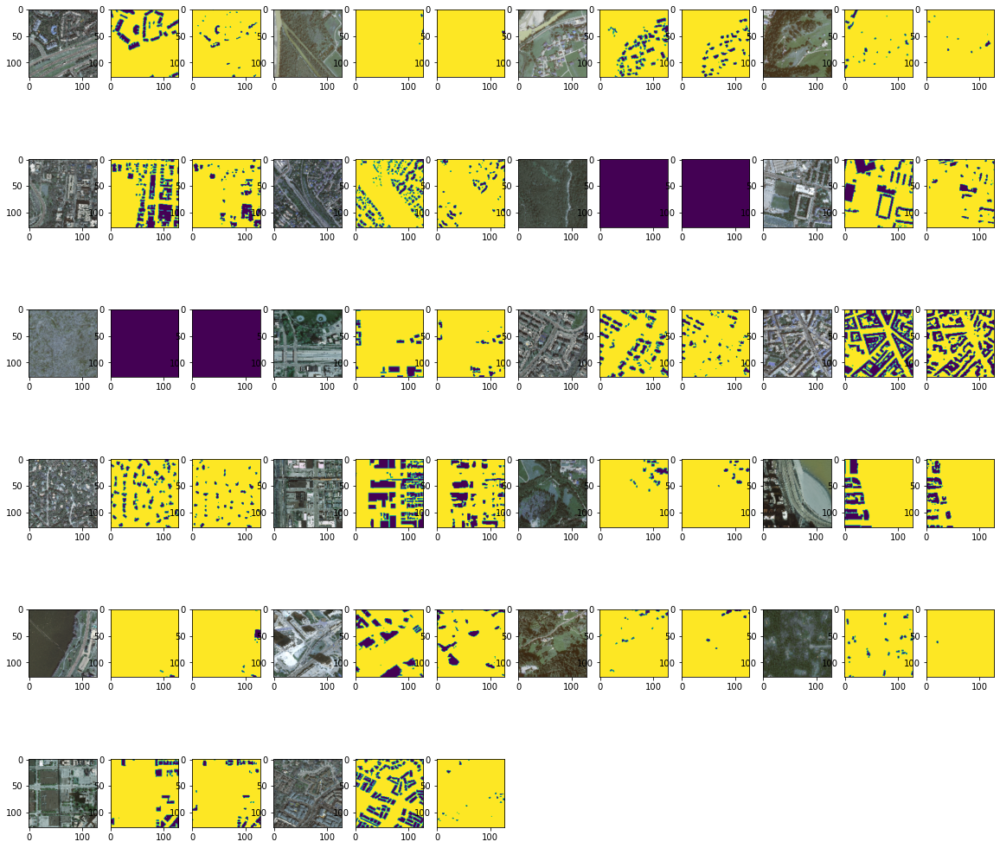

In [47]:
test_data, test_gt = next(test_generator)

visualise(segmenter_1, test_data, test_gt)

# Testing the network with real data

So far the models shows a pretty good result. Accuracy seems to be in the range of 70 to 80 percent. But how does the best model perform with real satellite images. This will test the model's ability to generalize and work with less than perfect data with lots of noise, variation, and different lighting condition. Even the height from ground level, time of day and type of structure will change in these test images for real satellite data. I used couple of random screen captured images of Dhaka, capital of Bangladesh from Google Earth. As well as segmenting the buildings, I will also show a percentage calculation. It will calculate the percentage of image covered with buildings or artificial structures. Dhaka is a densely populated city with compact development of buildings. So, the natural assumption is that the percentage would be high if the model performs properly. Let's see the results.

In [31]:
def calculate_ratio(img_path, model):
    im = cv2.imread(img_path)
    im = np.reshape(im, ((1, ) + np.shape(im)))
    print(f'Image shape is {im.shape}')
    
    pred = model.predict(im)
    pred[0] = np.where(pred[0] > 0.5, 0, 1)
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(1,2,1)
    ax.imshow(im[0])
    ax.set_title("Input Image")
    ax = fig.add_subplot(1,2,2)
    ax.imshow(pred[0])
    ax.set_title("Structures Identified")
    
    building_area = np.unique(pred[0], return_counts = True)[1][0]
    bg_area = np.unique(pred[0], return_counts = True)[1][1]
    building_percent = (building_area / (building_area+bg_area))*100
    
    print(f"\nPercentage of building(s): {building_percent:.2f}%")

In [32]:
calculate_ratio(r"test_images/dhanmondi-01.tif", segmenter_1)

NameError: name 'segmenter_1' is not defined

Image shape is (1, 128, 128, 3)

Percentage of building(s): 25.77%


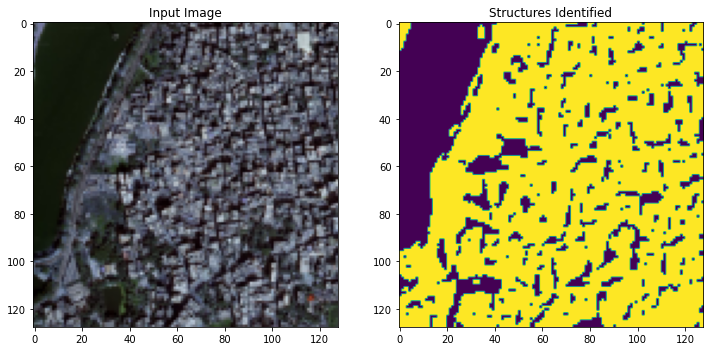

In [89]:
calculate_ratio(r"test_images/ran-01.tif", segmenter_1)

With two random images, we see that the model does not actually perform that great. Original input image is densely packed with buildings where as the predicted image do not detect much of them. Very faint shapes of them are detected in the first one. Second test image seems better although the whole river is detected as building, which is completely wrong. Model needs more tuning which for my pc would be resource consuming. I will also try focal loss to see if that improves the model or not.

**Network v 2.0**

Focal Loss

## Loss Function

In [107]:
# Using focal loss
def focal_loss(target, output, gamma=2):
    output /= K.sum(tf.cast(output, tf.float32), axis=-1, keepdims=True)
    eps = K.epsilon()
    output = K.clip(output, eps, 1. - eps)
    return -K.sum(K.pow(1. - output, gamma) * tf.cast(target, tf.float32) * K.log(output), axis=-1)

In [108]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
CHANNELS = 3

input_img = Input(shape = (IMG_WIDTH, IMG_HEIGHT, CHANNELS))

# Contraction Part
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same')(input_img) # Output 128 x 128
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1) # Output 128 x 128
conv1 = Dropout(0.1)(conv1)
pool1 = MaxPooling2D((2,2))(conv1) # Downsample 64 x 64

conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(pool1) # Output 64 x 64
conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(conv2) # Output 64 x 64
conv2 = Dropout(0.1)(conv2)
pool2 = MaxPooling2D((2, 2))(conv2) # Downsample 32 x 32

conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(pool2) # Output 32 x 32
conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv3) # Output 32 x 32
conv3 = Dropout(0.1)(conv3)
pool3 = MaxPooling2D((2, 2))(conv3) # Downsample 16 x 16

conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(pool3) # Output 16 x 16
conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(conv4) # Output 16 x 16
conv4 = Dropout(0.1)(conv4)
pool4 = MaxPooling2D((2, 2))(conv4) # Downsample 8 x 8

conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(pool4) # Output 8 x 8
conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(conv5) # Output 8 x 8

# Expansion Part
up1 = UpSampling2D((2, 2))(conv5) # Upsample 16 x 16

merge1 = concatenate([conv4, up1], axis = 3)
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(merge1) # Output 16 x 16
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(conv6) # Output 16 x 16
conv6 = Dropout(0.1)(conv6)
up2 = UpSampling2D((2, 2))(conv6) # Upsample 32 x 32

merge2 = concatenate([conv3, up2], axis = 3)
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(merge2) # Output 32 x 32
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv7) # Output 32 x 32
conv7 = Dropout(0.1)(conv7)
up3 = UpSampling2D((2, 2))(conv7) # Upsample 64 x 64

merge3 = concatenate([conv2, up3], axis = 3)
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(merge3) # Output 64 x 64
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv8) # Output 64 x 64
conv8 = Dropout(0.1)(conv8)
up3 = UpSampling2D((2, 2))(conv8) # Upsample 128 x 128

merge3 = concatenate([conv1, up3], axis = 3)
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(merge3) # Output 128 x 128
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(conv8) # Output 128 x 128
conv8 = Dropout(0.1)(conv8)

decoded = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(conv8)

segmenter_2 = Model(input_img, decoded, name= 'Segmenter2_FocalLoss')
segmenter_2.compile(optimizer = 'adam', loss = focal_loss)
print(segmenter_2.summary())

Model: "Segmenter2_FocalLoss"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_76 (Conv2D)              (None, 128, 128, 16) 448         input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_77 (Conv2D)              (None, 128, 128, 16) 2320        conv2d_76[0][0]                  
__________________________________________________________________________________________________
dropout_32 (Dropout)            (None, 128, 128, 16) 0           conv2d_77[0][0]                  
_______________________________________________________________________________

In [109]:
results_3 = segmenter_2.fit(train_generator, steps_per_epoch = 100, epochs=25,
              validation_data=test_generator, validation_steps = 10)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 100 steps, validate for 10 steps
Epoch 1/25
100/100 [==============================] - 178s 2s/step - loss: 1.4115e-21 - val_loss: 1.4217e-21
Epoch 2/25
100/100 [==============================] - 161s 2s/step - loss: 1.4080e-21 - val_loss: 1.4310e-21
Epoch 3/25
100/100 [==============================] - 157s 2s/step - loss: 1.4123e-21 - val_loss: 1.4212e-21
Epoch 4/25
100/100 [==============================] - 157s 2s/step - loss: 1.4132e-21 - val_loss: 1.4382e-21
Epoch 5/25
100/100 [==============================] - 156s 2s/step - loss: 1.4153e-21 - val_loss: 1.4220e-21
Epoch 6/25
100/100 [==============================] - 156s 2s/step - loss: 1.4119e-21 - val_loss: 1.4320e-21
Epoch 7/25
100/100 [==============================] - 157s 2s/step - loss: 1.4068e-21 - val_loss: 1.4388e-21
Epoch 8/25
100/100 [==============================] - 168s 2s/step - loss: 1.4128e-21 - val_loss: 1.4313e-21
Epoch 9/25
100/100 [===============

Image shape is (1, 128, 128, 3)

Percentage of building(s): 32.21%


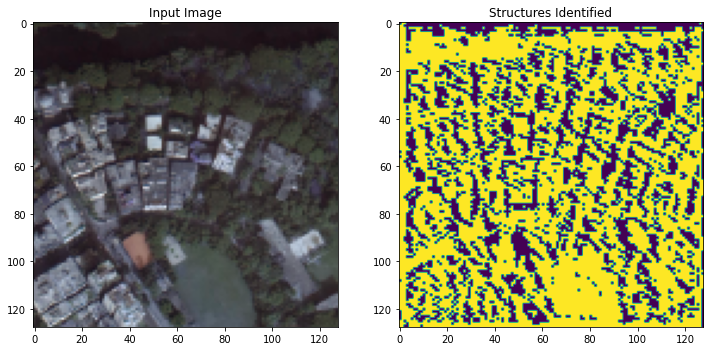

In [113]:
calculate_ratio(r"test_images/ran-03.tif", segmenter_2)

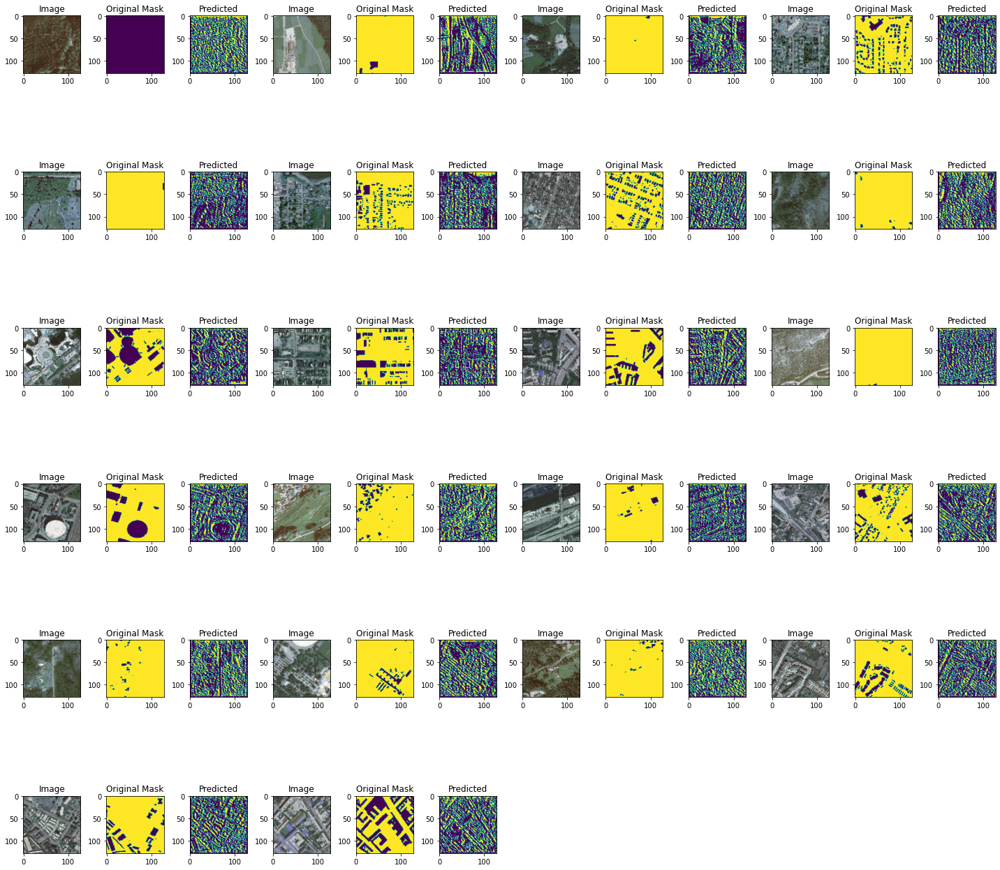

In [114]:
visualise(segmenter_2, test_data, test_gt)

In [115]:
segmenter_2.save('segmenter_2_FocalLoss_full_model.h5')

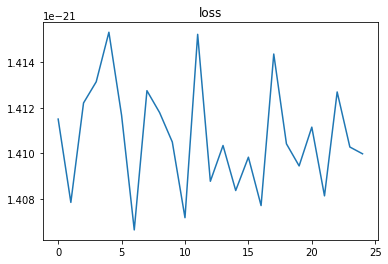

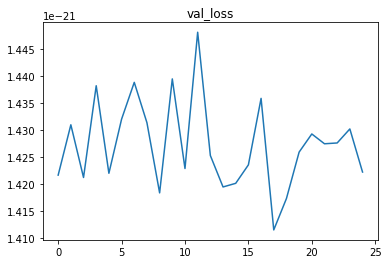

In [118]:
plot_model(results_3)

# Tuning the model

Neural networks have multiple hyper-parameters that decides the learning proecess and speed. Adjusting them produces better result given the adjustment are done in regards to the specific dataset.

In [30]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
CHANNELS = 3

input_img = Input(shape = (IMG_WIDTH, IMG_HEIGHT, CHANNELS))

# Contraction Part
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same')(input_img) # Output 128 x 128
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1) # Output 128 x 128
conv1 = Dropout(0.1)(conv1)
pool1 = MaxPooling2D((2,2))(conv1) # Downsample 64 x 64

conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(pool1) # Output 64 x 64
conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(conv2) # Output 64 x 64
conv2 = Dropout(0.1)(conv2)
pool2 = MaxPooling2D((2, 2))(conv2) # Downsample 32 x 32

conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(pool2) # Output 32 x 32
conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv3) # Output 32 x 32
conv3 = Dropout(0.1)(conv3)
pool3 = MaxPooling2D((2, 2))(conv3) # Downsample 16 x 16

conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(pool3) # Output 16 x 16
conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(conv4) # Output 16 x 16
conv4 = Dropout(0.1)(conv4)
pool4 = MaxPooling2D((2, 2))(conv4) # Downsample 8 x 8

conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(pool4) # Output 8 x 8
conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(conv5) # Output 8 x 8

# Expansion Part
up1 = UpSampling2D((2, 2))(conv5) # Upsample 16 x 16

merge1 = concatenate([conv4, up1], axis = 3)
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(merge1) # Output 16 x 16
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(conv6) # Output 16 x 16
conv6 = Dropout(0.1)(conv6)
up2 = UpSampling2D((2, 2))(conv6) # Upsample 32 x 32

merge2 = concatenate([conv3, up2], axis = 3)
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(merge2) # Output 32 x 32
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv7) # Output 32 x 32
conv7 = Dropout(0.1)(conv7)
up3 = UpSampling2D((2, 2))(conv7) # Upsample 64 x 64

merge3 = concatenate([conv2, up3], axis = 3)
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(merge3) # Output 64 x 64
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv8) # Output 64 x 64
conv8 = Dropout(0.1)(conv8)
up3 = UpSampling2D((2, 2))(conv8) # Upsample 128 x 128

merge3 = concatenate([conv1, up3], axis = 3)
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(merge3) # Output 128 x 128
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(conv8) # Output 128 x 128
conv8 = Dropout(0.1)(conv8)

decoded = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(conv8)

segmenter_3 = Model(input_img, decoded, name= 'Segmenter3_tuned')

learning_rate=1e-5
opt = keras.optimizers.Adam(learning_rate=learning_rate)
# sparse_categorical_crossentropy = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
segmenter_3.compile(optimizer = opt, loss = 'binary_crossentropy', metrics = ['accuracy'])
print(segmenter_3.summary())

Model: "Segmenter3_tuned"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_38 (Conv2D)              (None, 128, 128, 16) 448         input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_39 (Conv2D)              (None, 128, 128, 16) 2320        conv2d_38[0][0]                  
__________________________________________________________________________________________________
dropout_16 (Dropout)            (None, 128, 128, 16) 0           conv2d_39[0][0]                  
___________________________________________________________________________________

In [31]:
callbacks = [ModelCheckpoint('segmenter_3_tuned.h5', verbose = 1, save_best_only = True)]
results_4 = segmenter_3.fit(train_generator, steps_per_epoch = 100, epochs=25,
              validation_data=test_generator, validation_steps = 10, callbacks = callbacks)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 100 steps, validate for 10 steps
Epoch 1/25
 99/100 [============================>.] - ETA: 1s - loss: 0.6366 - accuracy: 0.7461
Epoch 00001: val_loss improved from inf to 0.50088, saving model to segmenter_3_tuned.h5
100/100 [==============================] - 181s 2s/step - loss: 0.6351 - accuracy: 0.7471 - val_loss: 0.5009 - val_accuracy: 0.8427
Epoch 2/25
 99/100 [============================>.] - ETA: 1s - loss: 0.5172 - accuracy: 0.8313
Epoch 00002: val_loss improved from 0.50088 to 0.50057, saving model to segmenter_3_tuned.h5
100/100 [==============================] - 171s 2s/step - loss: 0.5172 - accuracy: 0.8313 - val_loss: 0.5006 - val_accuracy: 0.8464
Epoch 3/25
 99/100 [============================>.] - ETA: 1s - loss: 0.5000 - accuracy: 0.8331
Epoch 00003: val_loss improved from 0.50057 to 0.48346, saving model to segmenter_3_tuned.h5
100/100 [==============================] - 170s 2s/step - loss: 0.4995 - accurac

In [34]:
segmenter_3.save("segmenter_3_full_run_full_model.h5")

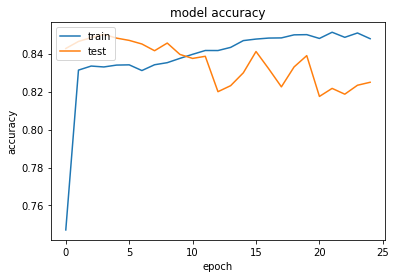

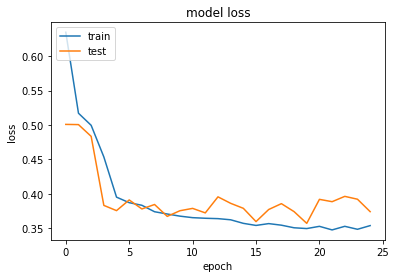

In [32]:
plt.plot(results_4.history['accuracy'])
plt.plot(results_4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(results_4.history['loss'])
plt.plot(results_4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

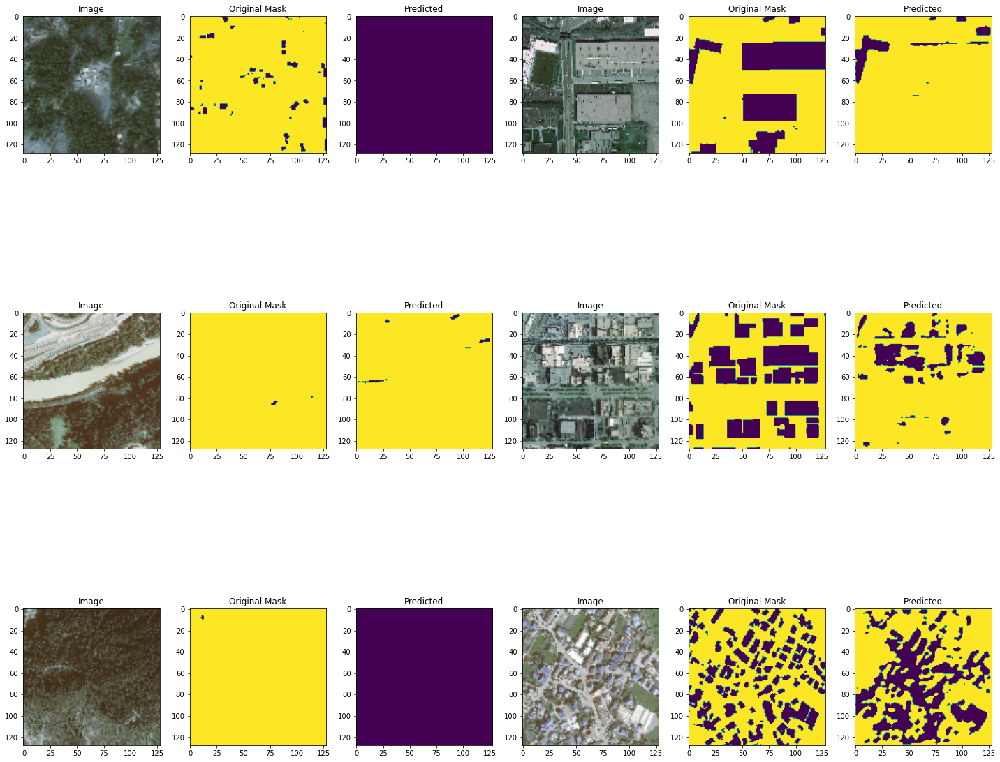

In [33]:
test_data, test_gt = next(test_generator)

show_prediction(segmenter_3, test_data, test_gt)

Image shape is (1, 128, 128, 3)

Percentage of building(s): 16.34%


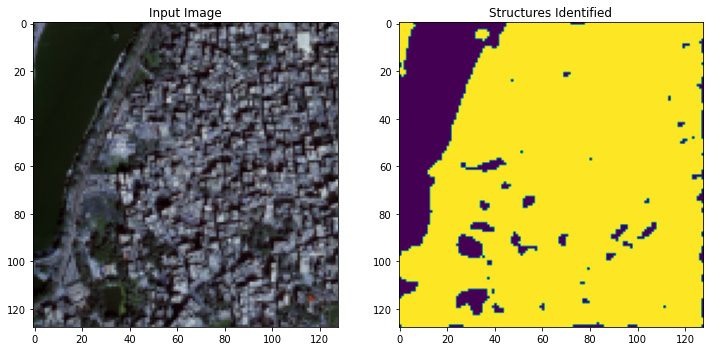

In [40]:
calculate_ratio(r"test_images/ran-01.tif", segmenter_3)

In [21]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
CHANNELS = 3

input_img = Input(shape = (IMG_WIDTH, IMG_HEIGHT, CHANNELS))

# Contraction Part
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same')(input_img) # Output 128 x 128
conv1 = Conv2D(16, (3,3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1) # Output 128 x 128
conv1 = Dropout(0.1)(conv1)
pool1 = MaxPooling2D((2,2))(conv1) # Downsample 64 x 64

conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(pool1) # Output 64 x 64
conv2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(conv2) # Output 64 x 64
conv2 = Dropout(0.1)(conv2)
pool2 = MaxPooling2D((2, 2))(conv2) # Downsample 32 x 32

conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(pool2) # Output 32 x 32
conv3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv3) # Output 32 x 32
conv3 = Dropout(0.1)(conv3)
pool3 = MaxPooling2D((2, 2))(conv3) # Downsample 16 x 16

conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(pool3) # Output 16 x 16
conv4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(conv4) # Output 16 x 16
conv4 = Dropout(0.1)(conv4)
pool4 = MaxPooling2D((2, 2))(conv4) # Downsample 8 x 8

conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(pool4) # Output 8 x 8
conv5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(conv5) # Output 8 x 8

# Expansion Part
up1 = UpSampling2D((2, 2))(conv5) # Upsample 16 x 16

merge1 = concatenate([conv4, up1], axis = 3)
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(merge1) # Output 16 x 16
conv6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(conv6) # Output 16 x 16
conv6 = Dropout(0.1)(conv6)
up2 = UpSampling2D((2, 2))(conv6) # Upsample 32 x 32

merge2 = concatenate([conv3, up2], axis = 3)
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(merge2) # Output 32 x 32
conv7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv7) # Output 32 x 32
conv7 = Dropout(0.1)(conv7)
up3 = UpSampling2D((2, 2))(conv7) # Upsample 64 x 64

merge3 = concatenate([conv2, up3], axis = 3)
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(merge3) # Output 64 x 64
conv8 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(conv8) # Output 64 x 64
conv8 = Dropout(0.1)(conv8)
up3 = UpSampling2D((2, 2))(conv8) # Upsample 128 x 128

merge3 = concatenate([conv1, up3], axis = 3)
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(merge3) # Output 128 x 128
conv8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(conv8) # Output 128 x 128
conv8 = Dropout(0.1)(conv8)

decoded = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(conv8)

segmenter_4 = Model(input_img, decoded, name= 'Segmenter4_tuned')

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=10000,
    decay_rate=0.9)

opt = keras.optimizers.Adam(learning_rate=lr_schedule)

# sparse_categorical_crossentropy = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

segmenter_4.compile(optimizer = opt, loss = 'binary_crossentropy', metrics = ['accuracy'])
print(segmenter_4.summary())

Model: "Segmenter4_tuned"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 128, 128, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 128, 128, 16) 2320        conv2d_19[0][0]                  
__________________________________________________________________________________________________
dropout_8 (Dropout)             (None, 128, 128, 16) 0           conv2d_20[0][0]                  
___________________________________________________________________________________

In [22]:
train_datagen = ImageDataGenerator(zoom_range=0.1, horizontal_flip=True)
train_image_generator = train_datagen.flow(X_train, batch_size = 64, seed=4)
train_mask_generator = train_datagen.flow(y_train, batch_size = 64, seed=4)

In [23]:
train_generator = crop_generator(zip(train_image_generator, train_mask_generator), 128)

In [24]:
val_datagen = ImageDataGenerator(zoom_range=0.1)
test_image_generator = val_datagen.flow(X_test, batch_size = 64, seed=4)
test_mask_generator = val_datagen.flow(y_test, batch_size = 64, seed=4)
test_generator = crop_generator(zip(test_image_generator, test_mask_generator), 128)

In [25]:
callbacks = [ModelCheckpoint('segmenter_4_tuned.h5', verbose = 1, save_best_only = True)]
results_4 = segmenter_4.fit(train_generator, steps_per_epoch = 100, epochs=50,
              validation_data=test_generator, validation_steps = 10, callbacks = callbacks)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 100 steps, validate for 10 steps
Epoch 1/50
 99/100 [============================>.] - ETA: 4s - loss: 2.6774 - accuracy: 0.8252
Epoch 00001: val_loss improved from inf to 0.41807, saving model to segmenter_4_tuned.h5
100/100 [==============================] - 537s 5s/step - loss: 2.6543 - accuracy: 0.8252 - val_loss: 0.4181 - val_accuracy: 0.8455
Epoch 2/50
 99/100 [============================>.] - ETA: 4s - loss: 0.4016 - accuracy: 0.8331
Epoch 00002: val_loss did not improve from 0.41807
100/100 [==============================] - 508s 5s/step - loss: 0.4015 - accuracy: 0.8331 - val_loss: 0.4186 - val_accuracy: 0.8430
Epoch 3/50
 99/100 [============================>.] - ETA: 4s - loss: 0.3871 - accuracy: 0.8348
Epoch 00003: val_loss did not improve from 0.41807
100/100 [==============================] - 506s 5s/step - loss: 0.3868 - accuracy: 0.8349 - val_loss: 0.4182 - val_accuracy: 0.8403
Epoch 4/50
 99/100 [============

In [28]:
save_pickle("results_4.pkl", results_4.history)

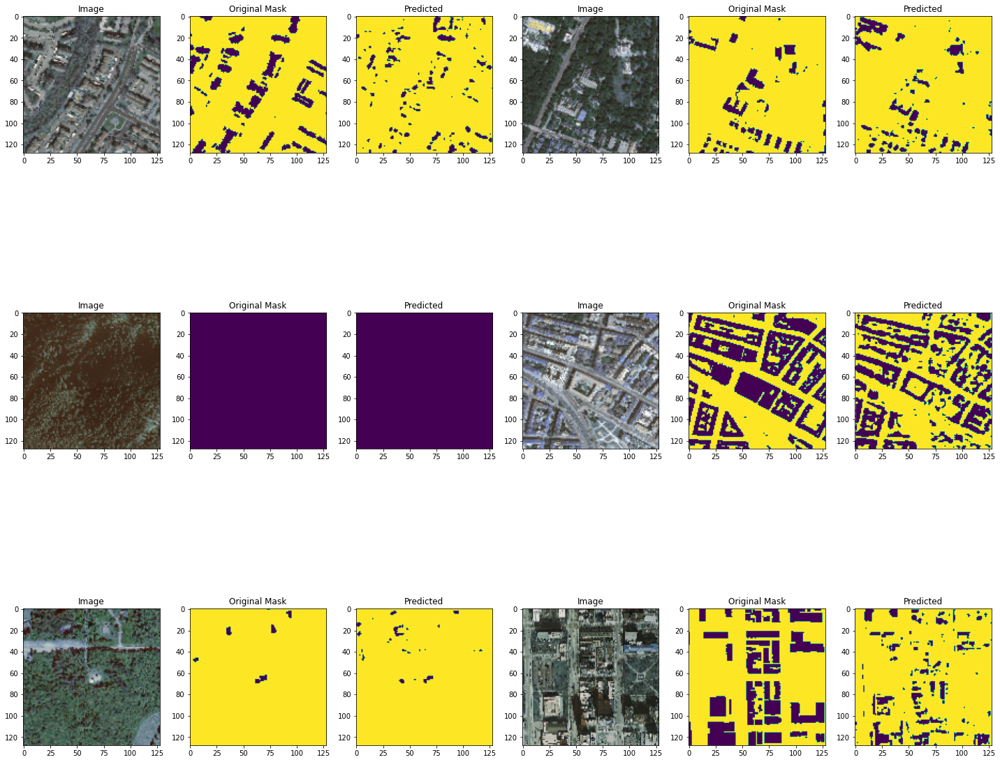

In [29]:
test_data, test_gt = next(test_generator)

show_prediction(segmenter_4, test_data, test_gt)

ValueError: num must be 1 <= num <= 96, not 97

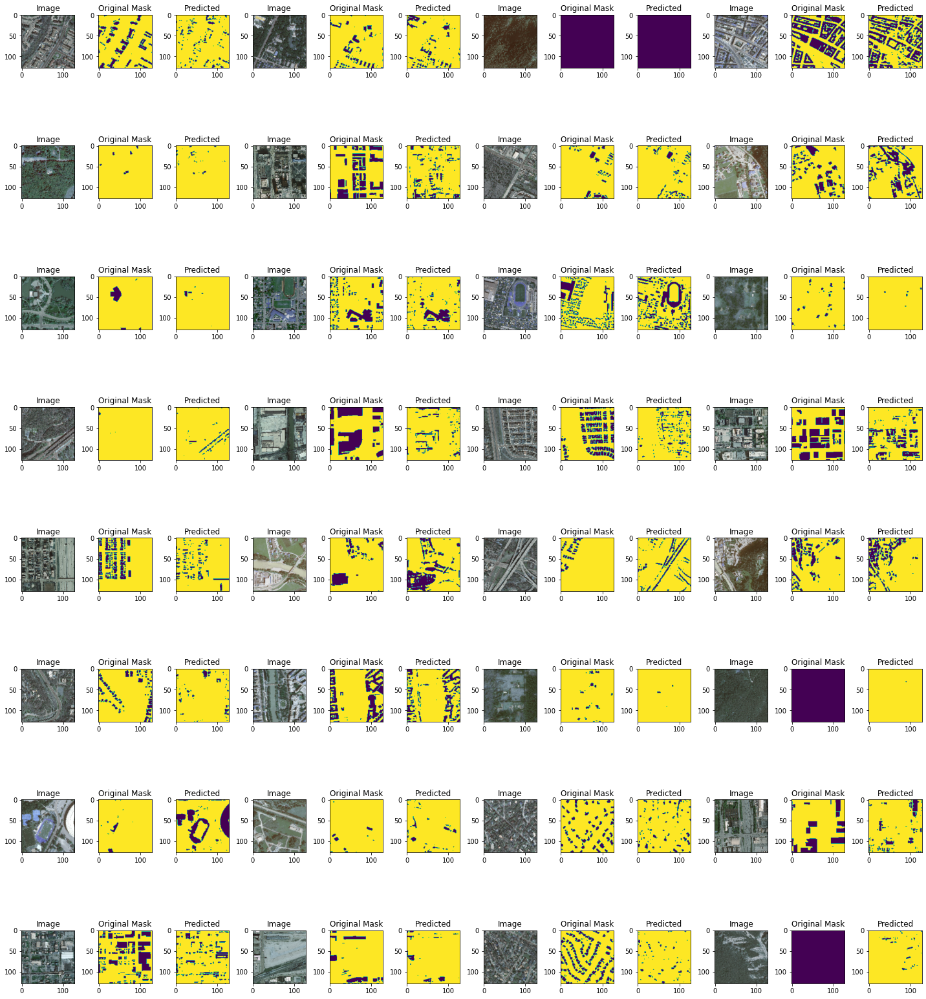

In [30]:
visualise(segmenter_4, test_data, test_gt)

In [39]:
image_path = r'test_images/*.tif'

resize = 512 # Resizing dimension
scale = 255.0 # Scaling value for RGB images (range 0 - 255)

real_images = load_files(image_path, resize, scale)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:03<00:00,  1.25it/s]


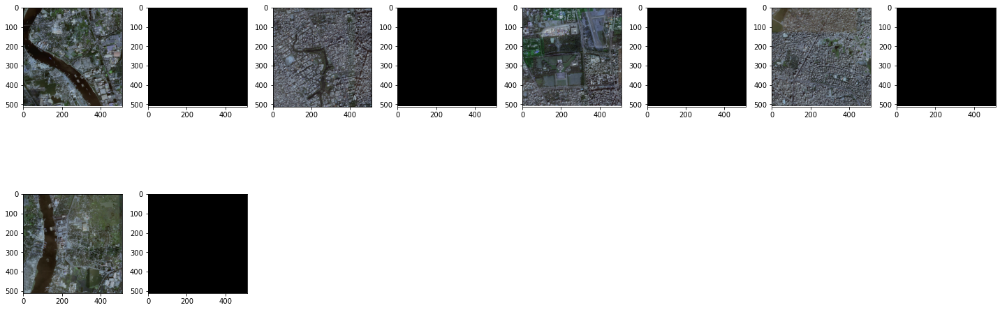

In [40]:
display_images(real_images, np.zeros(real_images.shape))

In [47]:
real_images_cropped = np.zeros((5, 128, 128, 3))
dx = 128
dy = 128
x = np.random.randint(0, 512 - dx + 1)
y = np.random.randint(0, 512 - dy + 1)

for idx, im in enumerate(real_images):
    real_images_cropped[idx] = im[y:(y+dy), x:(x+dx), :]

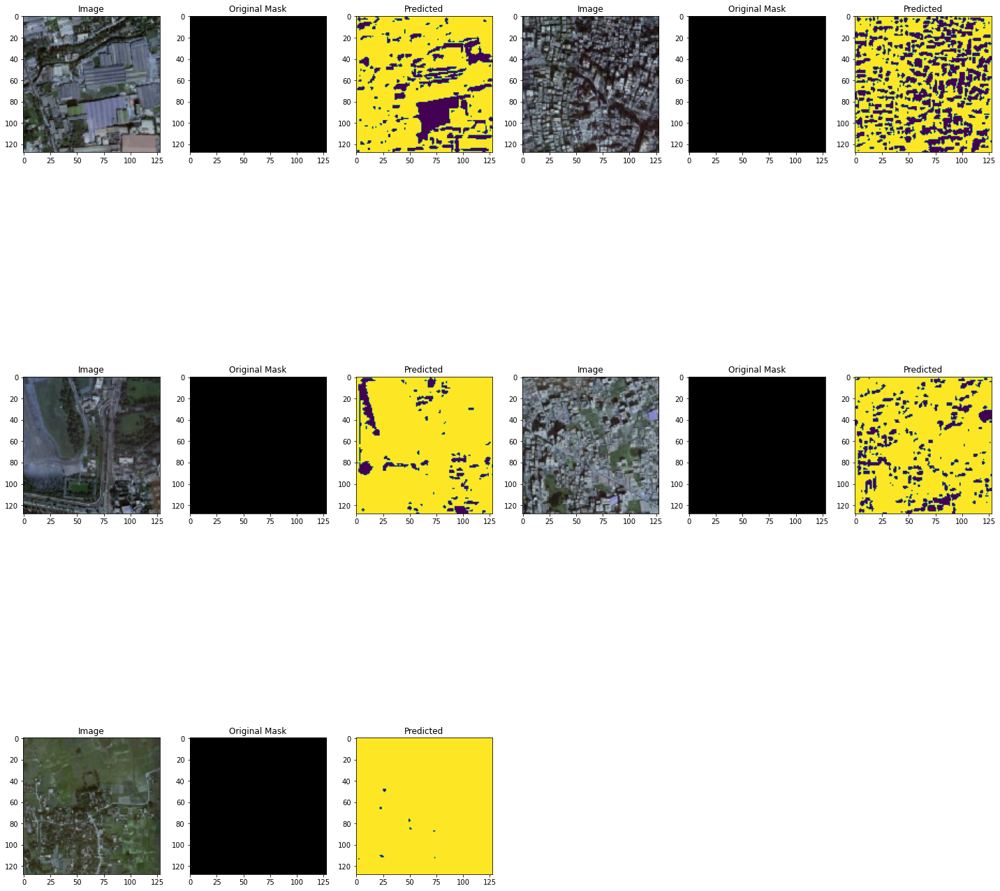

In [54]:
show_prediction(segmenter_4, real_images_cropped, np.zeros(real_images_cropped.shape))

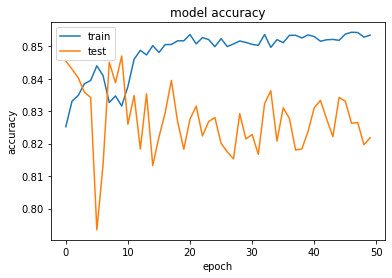

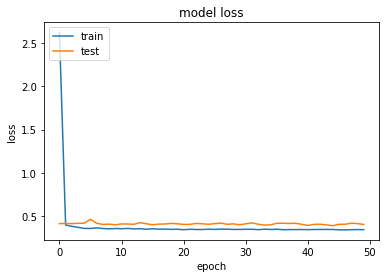

In [56]:
plt.plot(results_4.history['accuracy'])
plt.plot(results_4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(results_4.history['loss'])
plt.plot(results_4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Tensorflow U-net implementation
Google's Tensorflow library has an implementation of U-net, named `MobileNetV2`. U-net is a state of the art model for segmentation. And so I can compare the previous trials with the in-build 

In [ ]:
from tensorflow_examples.models.pix2pix import pix2pix

In [ ]:
OUTPUT_CHANNELS = 1

In [ ]:
# U-net implementation adapted from Tensorflow documentation
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

# Decoder
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]



In [ ]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


## Train the model

In [ ]:
unet = unet_model(OUTPUT_CHANNELS)
unet.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
tf.keras.utils.plot_model(unet, show_shapes=True)


In [ ]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = 10
STEPS_PER_EPOCH = 100
callbacks = [ModelCheckpoint('segmenter_4_tuned.h5', verbose = 1, save_best_only = True)]

model_history = unet.fit(train_generator, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_generator,
                          callbacks=callbacks)
